Install transformers, diffusers and torch and import required
 liberaries

In [2]:
!pip install diffusers["torch"] transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.1/989.1 kB 7.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.2/251.2 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 54.0 MB/s eta 0:00:00
  Created wheel for diffusers: filename=diffusers-0.20.2-py3-none-any.whl size=1342633 sha256=6fd7e3501e5f69743d0e39e667ea4883a5f3eadb0ada811cc9337a4fee519655
  Stored in directory: /root/.cache/pip/wheels/dc/8b/d9/34f7a1936109e05e9bba0cc2241a6f8cd89e25959dc7aae942
Successfully built diffusers


In [3]:
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation

In [4]:
from diffusers import StableDiffusionInpaintPipeline

In [5]:
import PIL
from PIL import Image
import requests
import torch
from io import BytesIO
import matplotlib.pyplot as plt
import torchvision.transforms as T
import time

In [6]:
#download image and open using PIL
def download_image(url):
    response = requests.get(url)
    return PIL.Image.open(BytesIO(response.content)).convert("RGB")

#transpose tensor into PIL Image
transform = T.ToPILImage()

In [7]:
#load pretrained clip based segmation model and processor
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

In [8]:
#load stable diffusion pre trained model and use cuda since we will use GPU T4 for faster inference.

pipeline = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    revision="fp16",
    torch_dtype=torch.float16,
)
pipeline = pipeline.to("cuda")

unet/diffusion_pytorch_model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


 Noticed here torch.float16 is used instead of torch.float32 why ?

 1. Accuacy is almost same (I tired inpainitng multiple image didn't see much difference in the output, But need more testing to make final conclusion)for both the type float32 and float16
 2. Latency : With float16, inference time is 3x less and gpu utilization is also ~42% less compare to Float 32.

  Float 16 : inference time:  08 sec, System RAM (6.0 / 12.7 GB ) , GPU RAM (4.8 / 15.0 GB)

  Foat 32 : inference time:  24 sec, System RAM (7.2 / 12.7 GB ),  GPU RAM (8.3 / 15.0 GB)

Latecny is checked for inpainintg one item at a time.


In [9]:
#provide input as img_url, source_object, desired_object and get the desire output
def app(prepare_input):
  img_url = prepare_input[0]
  image = download_image(img_url).resize((512, 512))
  inp_img = image.copy()
  source_prompts = prepare_input[1]
  desired_prompts = prepare_input[2]

  final_output = []
  masked_img = []

  inputs = processor(text=source_prompts, images=[inp_img] * len(source_prompts), padding="max_length", return_tensors="pt")
  # predict
  with torch.no_grad():
    outputs = model(**inputs) #segment source_object
  preds = outputs.logits.unsqueeze(1)

  if len(source_object) > 1:
    mask = [torch.sigmoid(preds[i][0]) for i in range(len(source_object))] #torch.Size([2, 1, 352, 352])
  else:
    preds = preds.permute(1, 0, 2)
    mask = [torch.sigmoid(preds[0])]

  for j in range(len(desired_object)):
    mask_image = transform(mask[j])
    mask_image = mask_image.resize((512, 512))
    masked_img.append(mask_image)
    inpaint_image = pipeline(prompt=desired_prompts[j], image=inp_img, mask_image=mask_image).images[0] #replace segmented source_object with desired_object
    final_output.append(inpaint_image)
    inp_img = inpaint_image
  return image, masked_img, final_output

In [10]:
#plot input image and output replaced image
#plot input image and source masked object for segment qualitybased on text promt
def plot_edits(image, masked_img, source_object, desired_object, final_output):
  _, ax = plt.subplots(1, len(masked_img) + 1, figsize=(3*(len(masked_img) + 1), 4))
  [a.axis('off') for a in ax.flatten()]
  ax[0].imshow(image)
  ax[0].text(150, -30, "original image")

  [ax[i+1].imshow(masked_img[i]) for i in range(len(source_object))];
  [ax[i+1].text(150, -30, "masked: "+prompt) for i, prompt in enumerate(source_object)];

  _, ax = plt.subplots(1, len(final_output) + 1, figsize=(3*(len(final_output) + 1), 4))
  [a.axis('off') for a in ax.flatten()]
  ax[0].imshow(image)
  ax[0].text(150, -30, "original image")

  [ax[i+1].imshow(final_output[i]) for i in range(len(desired_object))];
  [ax[i+1].text(150, -30, prompt) for i, prompt in enumerate(desired_object)];

In [11]:
# run function for end to end pipeline
def run(prepare_input):
  start_time = time.time()
  image,masked_img, final_output =  app(prepare_input)
  print("models inference time --- %s seconds ---" % (time.time() - start_time))

  plot_edits(image, masked_img, prepare_input[1],  prepare_input[2], final_output)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 11.7936110496521 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.68525505065918 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.957706689834595 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.48061990737915 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.539057970046997 seconds ---


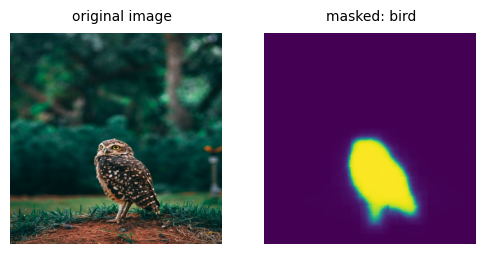

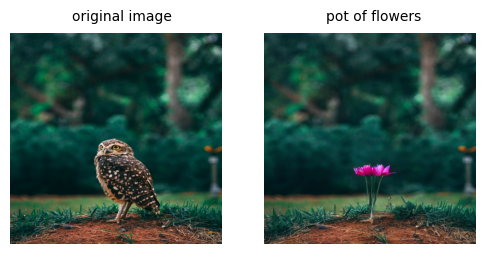

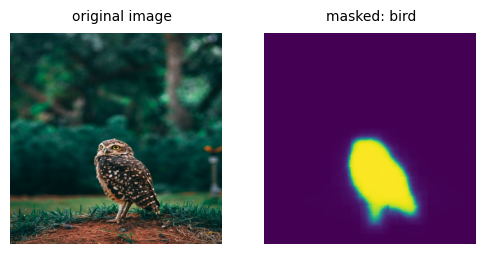

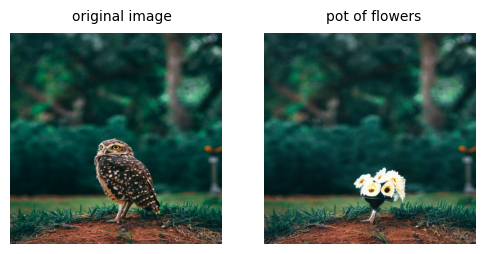

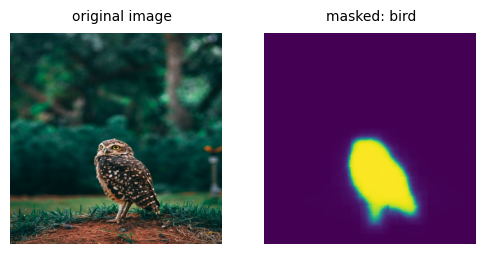

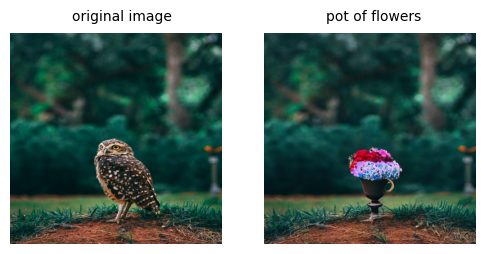

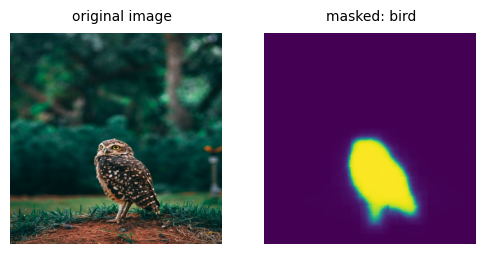

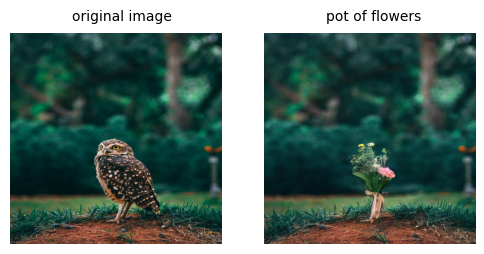

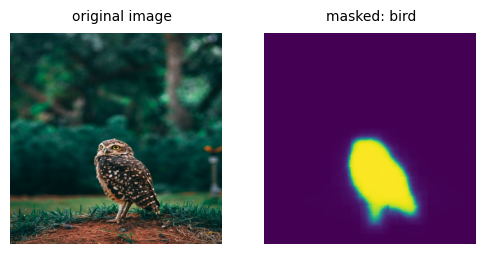

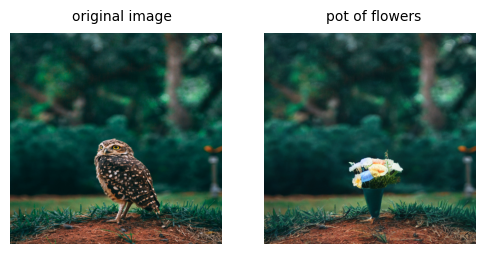

In [13]:
#copy image address from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2115984/pexels-photo-2115984.jpeg?width=1000"
source_object = ["bird"]
desired_object = ["pot of flowers"]

prepare_input = [img_url, source_object, desired_object]
for i in range(5):
  run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.254611492156982 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.128797054290771 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.939147710800171 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.854838132858276 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.784687757492065 seconds ---


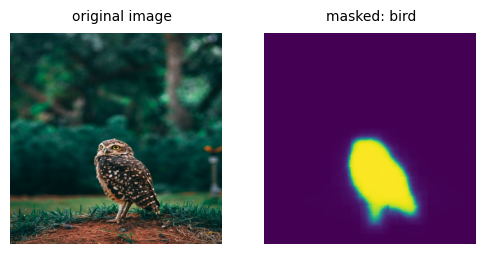

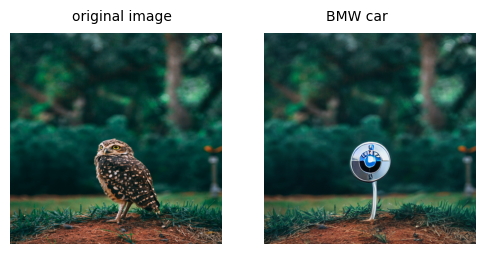

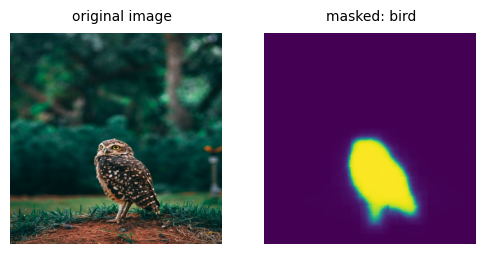

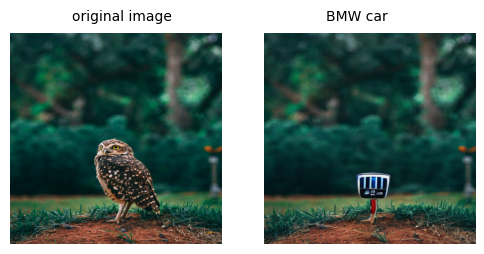

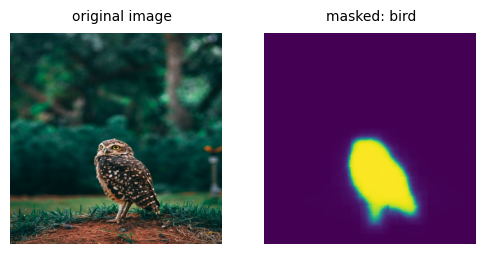

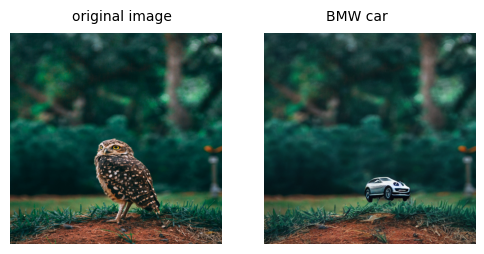

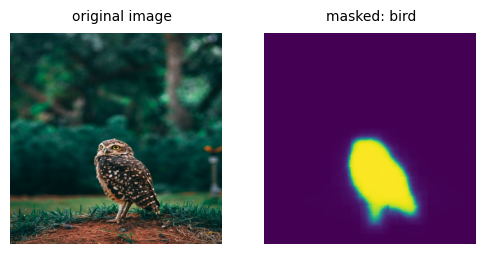

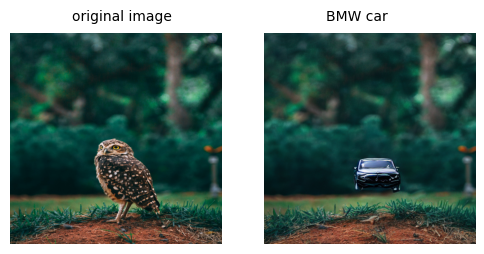

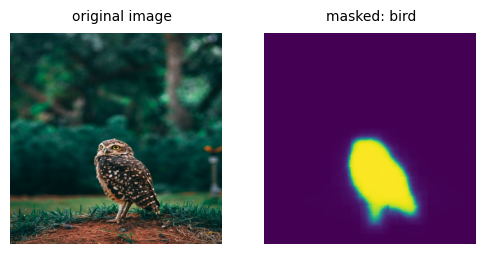

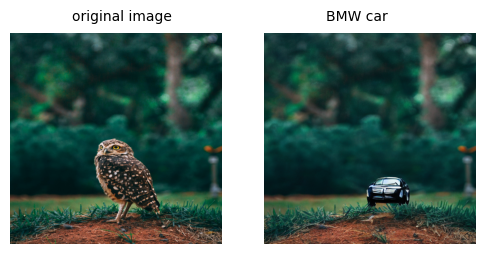

In [18]:
#copy image address from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2115984/pexels-photo-2115984.jpeg?width=1000"
source_object = ["bird"]
desired_object = ["BMW car"]

prepare_input = [img_url, source_object, desired_object]
for i in range(5):
  run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.093386888504028 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.923967599868774 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.875376224517822 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.089731454849243 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.711724519729614 seconds ---


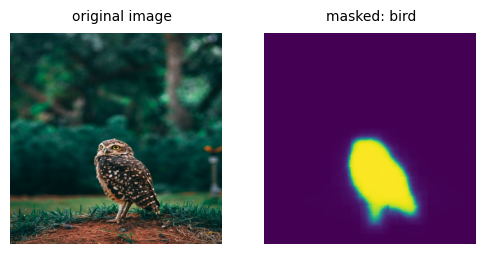

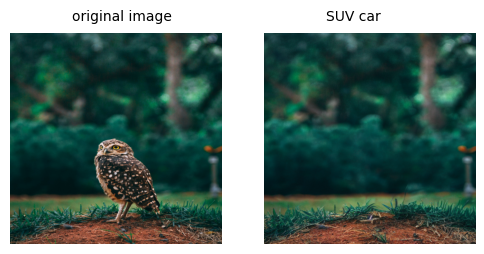

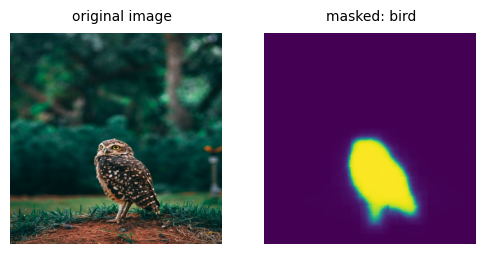

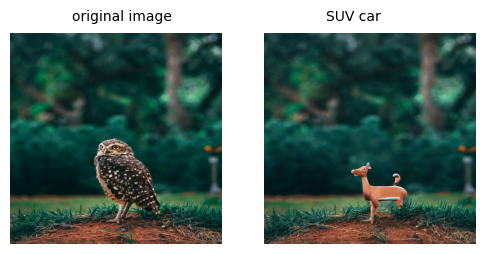

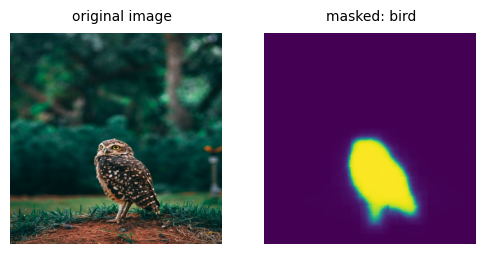

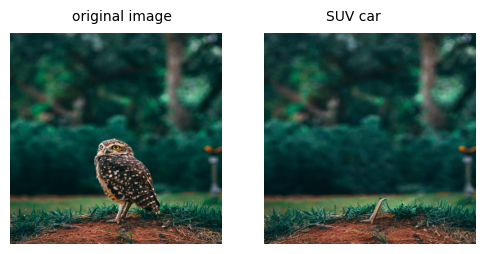

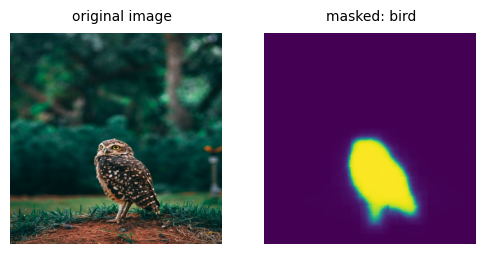

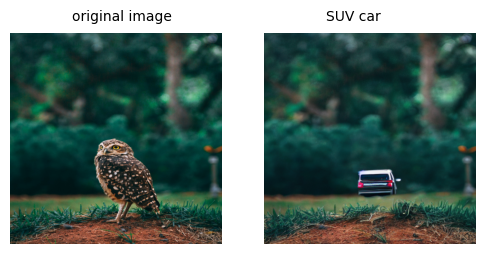

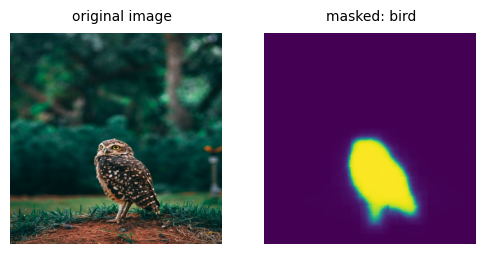

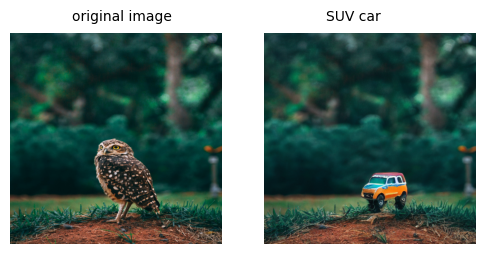

In [19]:
#copy image address from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2115984/pexels-photo-2115984.jpeg?width=1000"
source_object = ["bird"]
desired_object = ["SUV car"]

prepare_input = [img_url, source_object, desired_object]
for i in range(5):
  run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.381528377532959 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.855088710784912 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.00438380241394 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.935063600540161 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.734630346298218 seconds ---


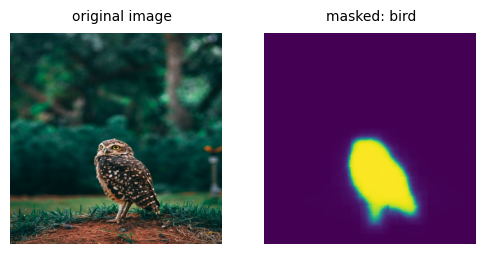

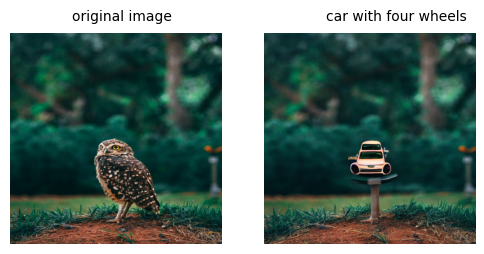

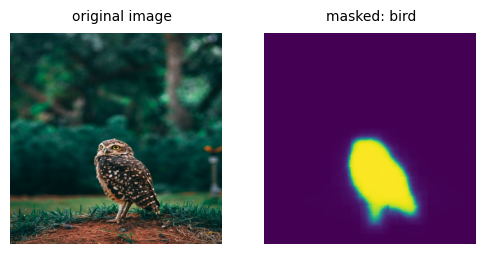

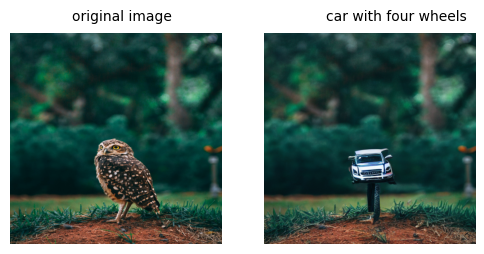

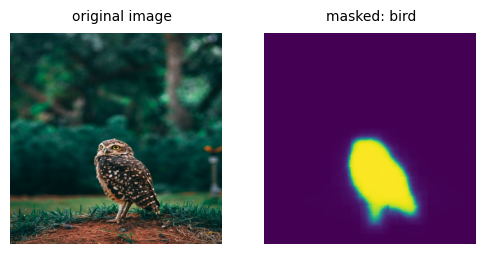

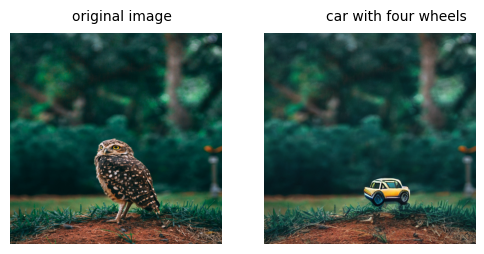

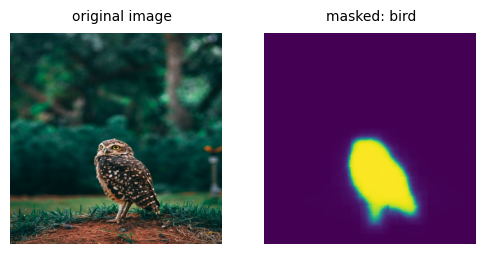

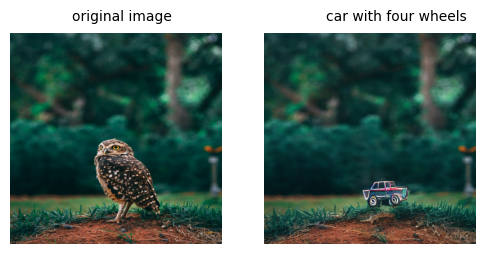

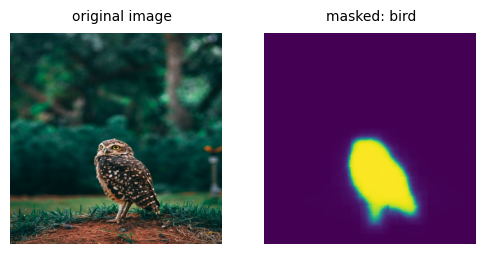

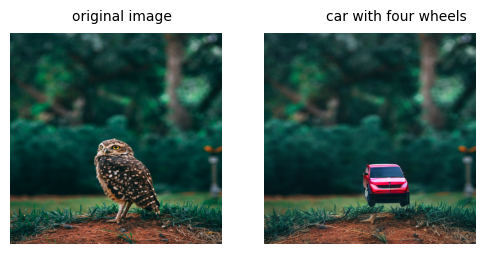

In [20]:
#copy image address from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2115984/pexels-photo-2115984.jpeg?width=1000"
source_object = ["bird"]
desired_object = ["car with four wheels"]

prepare_input = [img_url, source_object, desired_object]
for i in range(5):
  run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.955060482025146 seconds ---


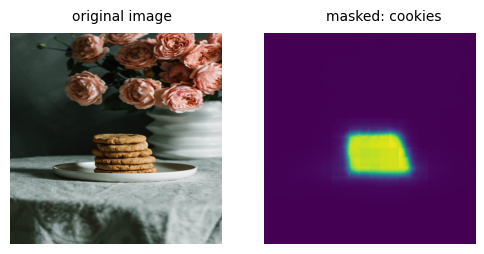

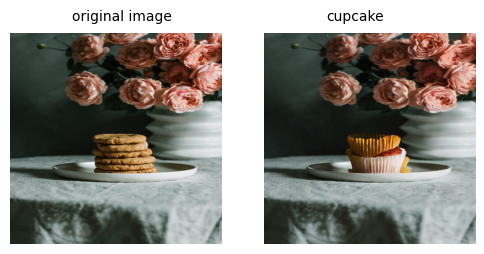

In [ ]:
#copy image path from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2377477/pexels-photo-2377477.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1"
source_object = ["cookies"]
desired_object = ["cupcake"]
prepare_input = [img_url, source_object, desired_object]

run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.501650094985962 seconds ---


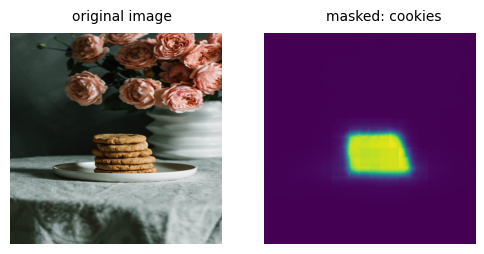

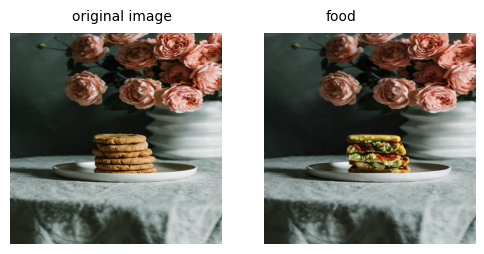

In [ ]:
#copy image path from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2377477/pexels-photo-2377477.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1"
source_object = ["cookies"]
desired_object = ["food"]
prepare_input = [img_url, source_object, desired_object]

run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 11.081377506256104 seconds ---


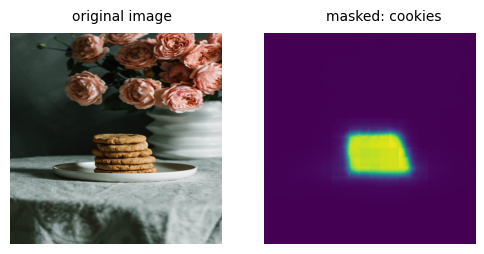

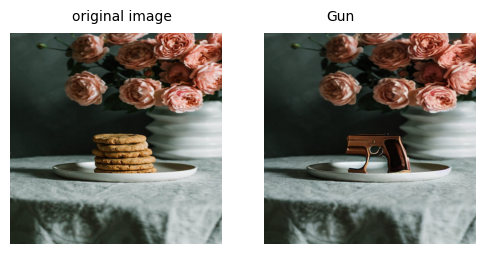

In [ ]:
#copy image path from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2377477/pexels-photo-2377477.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1"
source_object = ["cookies"]
desired_object = ["Gun"]
prepare_input = [img_url, source_object, desired_object]

run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.083903312683105 seconds ---


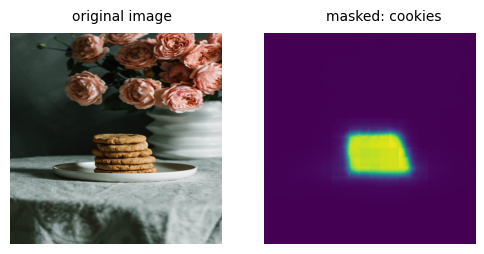

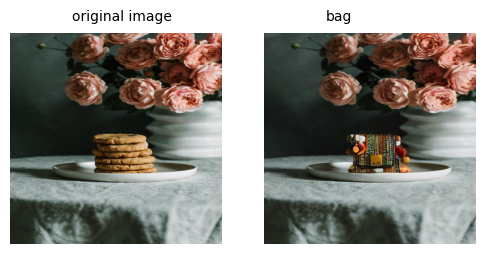

In [ ]:
#copy image path from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2377477/pexels-photo-2377477.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1"
source_object = ["cookies"]
desired_object = ["bag"]
prepare_input = [img_url, source_object, desired_object]

run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.882428646087646 seconds ---


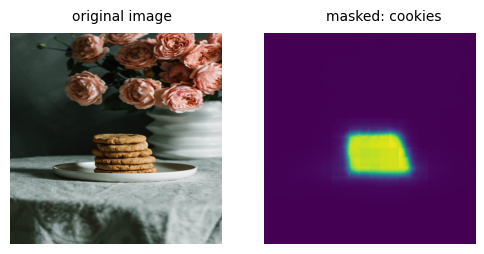

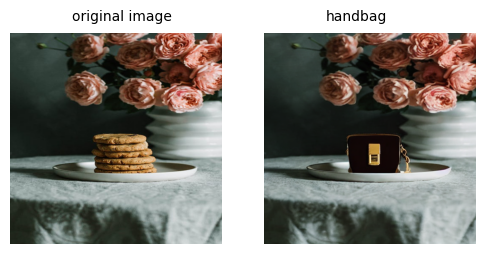

In [ ]:
#copy image path from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2377477/pexels-photo-2377477.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1"
source_object = ["cookies"]
desired_object = ["handbag"]
prepare_input = [img_url, source_object, desired_object]

run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.843762636184692 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.743384838104248 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.749114513397217 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.852855205535889 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.507256269454956 seconds ---


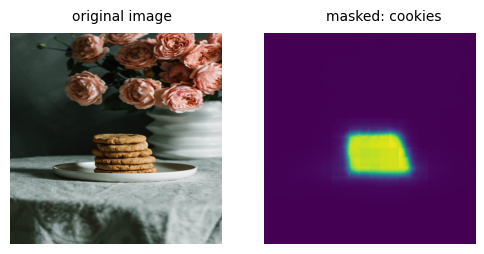

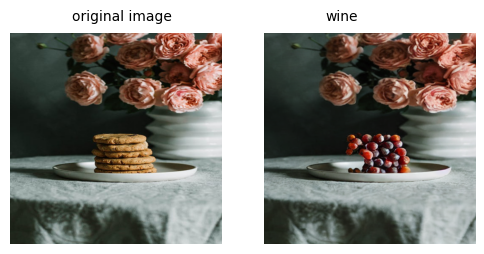

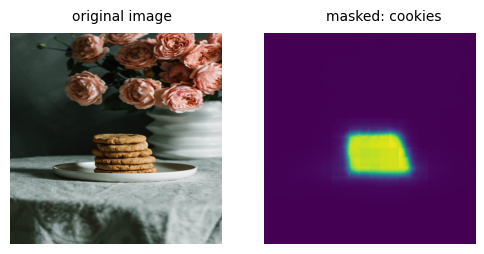

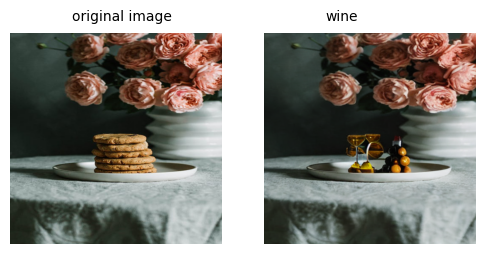

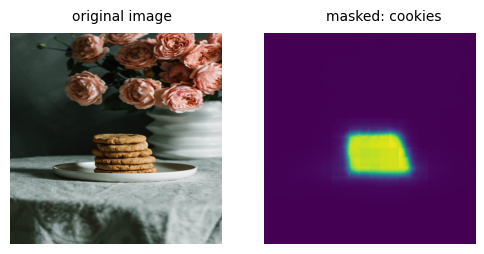

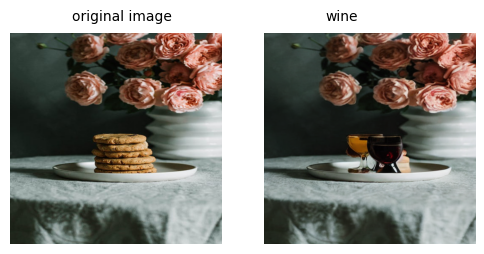

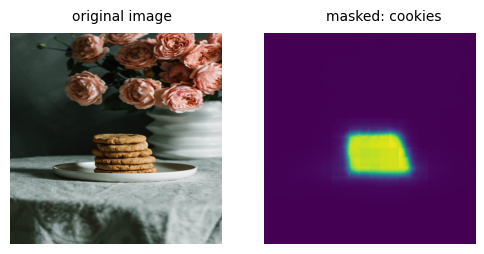

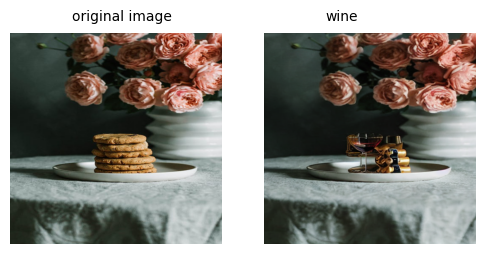

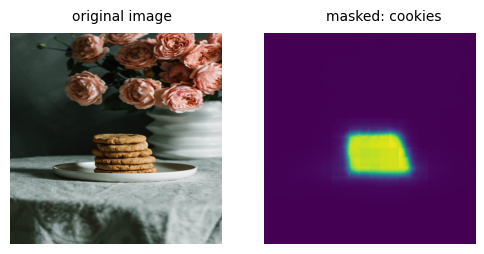

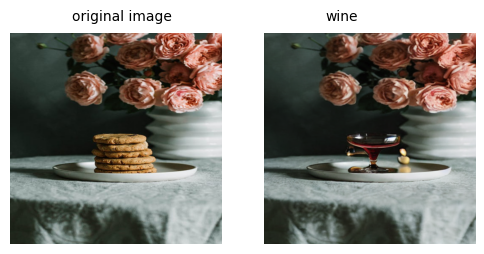

In [ ]:
#copy image path from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2377477/pexels-photo-2377477.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1"
source_object = ["cookies"]
desired_object = ["wine"]
prepare_input = [img_url, source_object, desired_object]
for i in range(5):
  run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 11.05873703956604 seconds ---


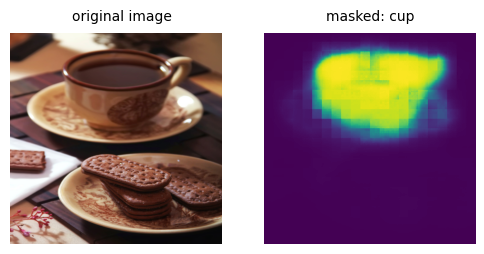

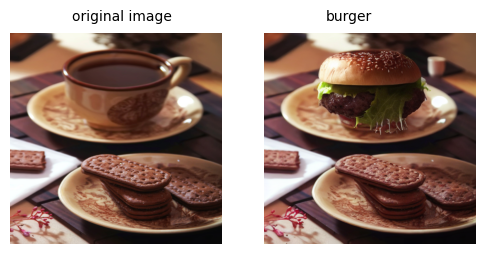

In [ ]:
img_url = "https://images.pexels.com/photos/2171643/pexels-photo-2171643.jpeg?auto=compress&cs=tinysrgb&w=1600&lazy=load"
source_object = ["cup"]
desired_object = ["burger"]
prepare_input = [img_url, source_object, desired_object]

run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.048921585083008 seconds ---


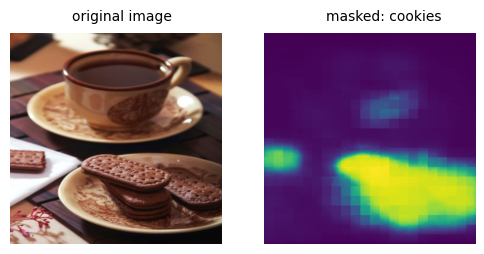

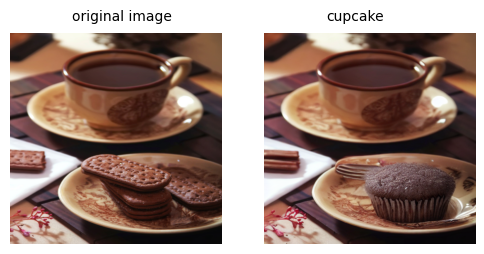

In [ ]:
img_url = "https://images.pexels.com/photos/2171643/pexels-photo-2171643.jpeg?auto=compress&cs=tinysrgb&w=1600&lazy=load"
source_object = ["cookies"]
desired_object = ["cupcake"]
prepare_input = [img_url, source_object, desired_object]

run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.005110263824463 seconds ---


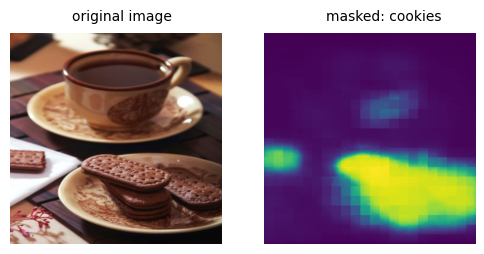

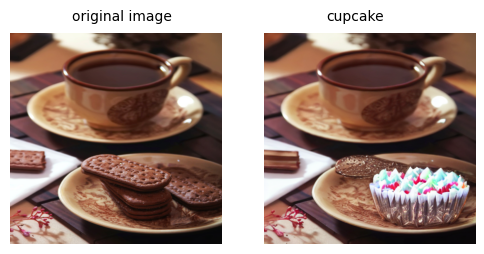

In [ ]:
#copy image path from google, one source is listed here # https://www.pexels.com/photo/pink-flowers-beside-plate-of-biscuits-2377474/
img_url = "https://images.pexels.com/photos/2171643/pexels-photo-2171643.jpeg?auto=compress&cs=tinysrgb&w=1600&lazy=load"
source_object = ["cookies"]
desired_object = ["cupcake"]
prepare_input = [img_url, source_object, desired_object]

run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 21.229743242263794 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 20.43713665008545 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 19.77644681930542 seconds ---


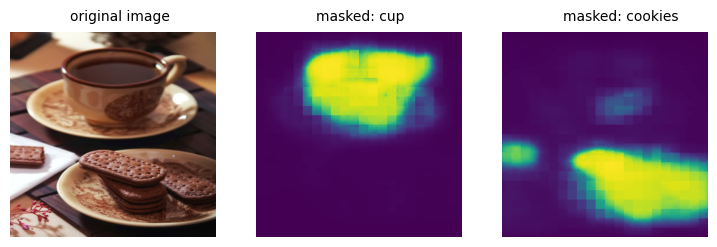

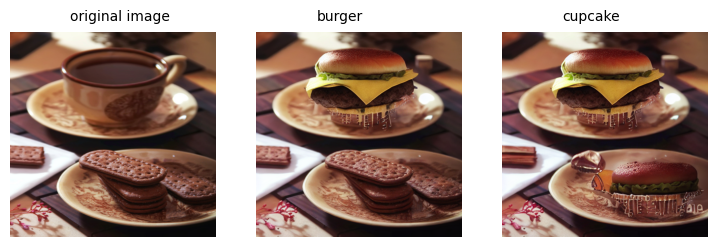

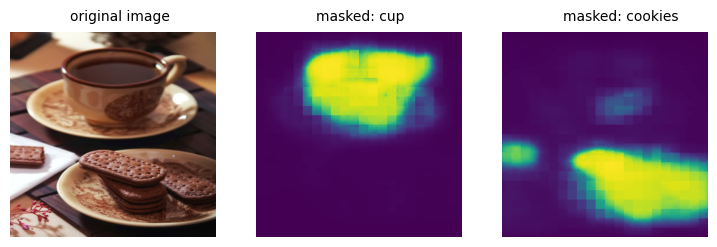

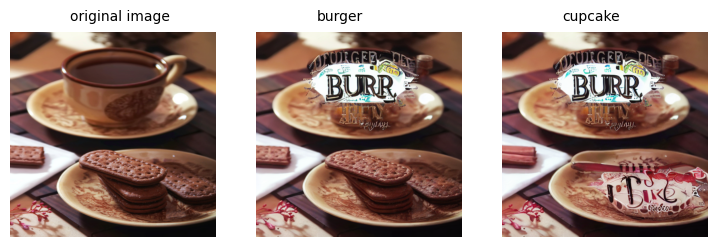

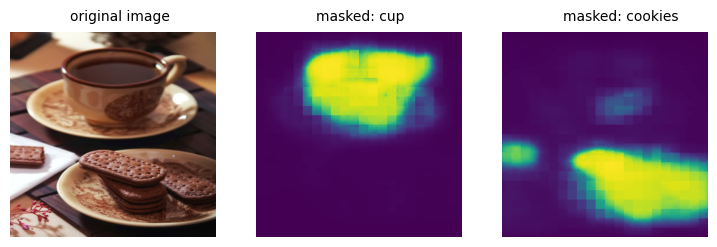

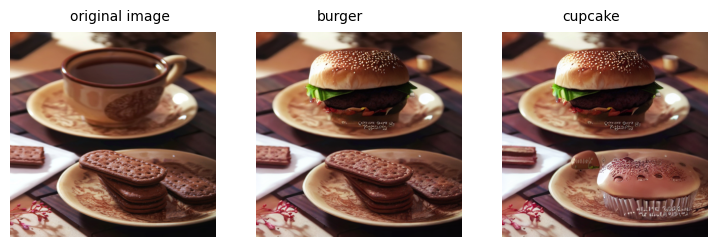

In [ ]:
img_url = "https://images.pexels.com/photos/2171643/pexels-photo-2171643.jpeg?auto=compress&cs=tinysrgb&w=1600&lazy=load"
source_object = ["cup", "cookies"]
desired_object = ["burger","cupcake"]
prepare_input = [img_url, source_object, desired_object]

for i in range(3):
  run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.542954444885254 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.610697031021118 seconds ---


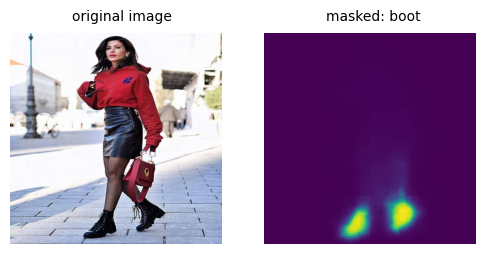

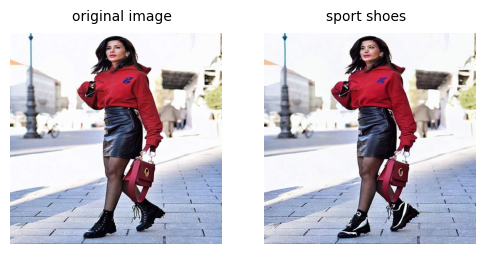

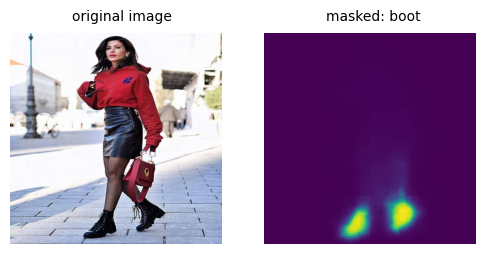

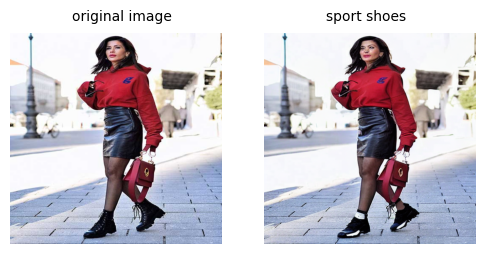

In [ ]:
img_url = "https://www.stylecraze.com/wp-content/uploads/2018/01/26.-Combat-Boots-Are-A-Classic-Too.jpg"
source_object = ["boot"]
desired_object = ["sport shoes"]
prepare_input = [img_url, source_object, desired_object]
for i in range(2):
  run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 10.211301803588867 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.717861413955688 seconds ---


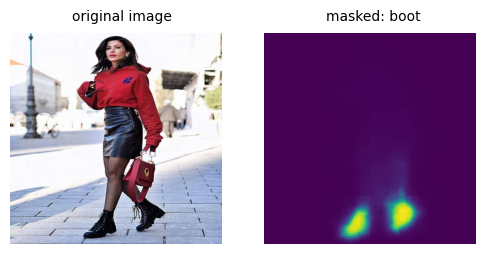

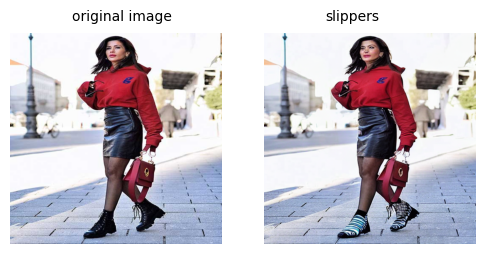

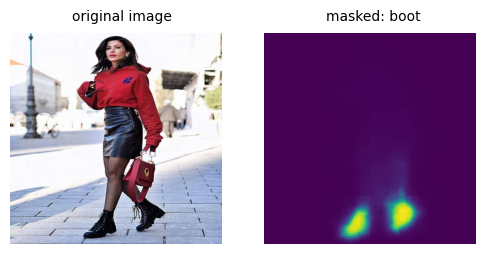

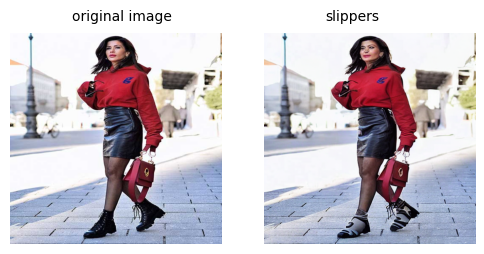

In [ ]:
img_url = "https://www.stylecraze.com/wp-content/uploads/2018/01/26.-Combat-Boots-Are-A-Classic-Too.jpg"
source_object = ["boot"]
desired_object = ["slippers"]
prepare_input = [img_url, source_object, desired_object]
for i in range(2):
  run(prepare_input)

  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.31268310546875 seconds ---


  0%|          | 0/50 [00:00<?, ?it/s]

models inference time --- 9.264112710952759 seconds ---


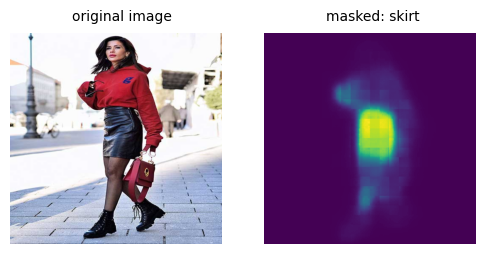

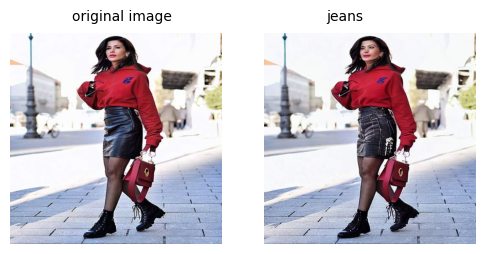

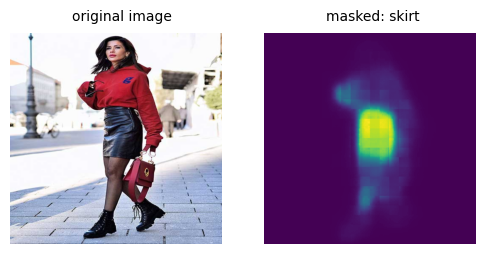

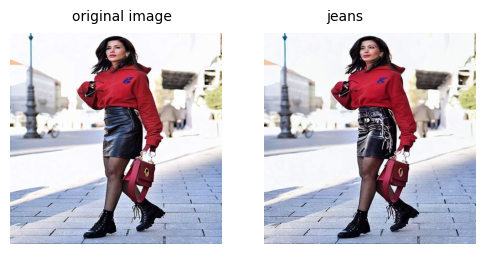

In [ ]:
img_url = "https://www.stylecraze.com/wp-content/uploads/2018/01/26.-Combat-Boots-Are-A-Classic-Too.jpg"
source_object = ["skirt"]
desired_object = ["jeans"]
prepare_input = [img_url, source_object, desired_object]
for i in range(2):
  run(prepare_input)